# Problem-Specific Coordinate Generation for HyperNEAT Substrates

## Setup

The testing was done on a 16GB VRAM GPU with CUDA 12.8. VRAM usage is determined mainly by substrate and population size.

### Imports

This setup requires some dependencies, mainly TensorNEAT, JAX, numpy, matplotlib, NetworkX, scikit-learn and wandb for logging. Using a virtual environment (i.e. conda) is highly recommended. Python 3.10.18 was used in development and testing.

In [1]:
import jax
import numpy as np
import wandb
import matplotlib.pyplot as plt
from collections import defaultdict

from config import config
from tensorneat.algorithm.hyperneat import FullSubstrate

from substrate_generation.pca_coor_generator import PCAanalyzer 
from substrate_generation.pca_inv_coor_generator import InvPCAanalyzer 
from substrate_generation.sdl_coor_generator import SparseDictionaryAnalyzer
from substrate_generation.fa_coor_generator import FactorAnalyzer
from substrate_generation.manual_coor_generator import ManualInputMapper
from substrate_generation.data_sampling import collect_random_policy_data, collect_trained_agent_policy_data
from evol_pipeline.brax_env import CustomBraxEnv
from evol_pipeline.custom_pipeline import CustomPipeline
from substrate_generation.hidden_layers import HiddenLayerGenerator
from utils.visualization import visualize_cppn, visualize_nn, display_plots_side_by_side
from utils.utils import save_coordinates_to_csv, setup_folder_structure
from evol_pipeline.evol_algorithm import create_evol_algorithm

A quick setup of the folder structure to avoid errors further down the line.

In [2]:
OUTPUT_DIR = config["experiment"]["output_dir"]
setup_folder_structure(OUTPUT_DIR)

### Setup Environment

[Brax environments](https://github.com/google/brax/tree/main/brax/envs) are used for this experiment through the [TensorNEAT wrapper](https://github.com/EMI-Group/tensorneat/tree/main/src/tensorneat/problem/rl).

In [3]:
env_name = config["experiment"]["env_name"]
env_problem = CustomBraxEnv(
    env_name=env_name,
    backend=config["environment"]["backend"],
    brax_args=config["environment"]["brax_args"],
    max_step=config["environment"]["max_step"],
    repeat_times=config["environment"]["repeat_times"],
    obs_normalization=False,
    sample_episodes=16,
)
obs_size = env_problem.input_shape[0]
act_size = env_problem.output_shape[0]

print("env_problem.input_shape: ", env_problem.input_shape)
print("env_problem.input_shape: ", env_problem.output_shape)

/home/andi/anaconda3/envs/jax/lib/python3.10/site-packages/brax/io/mjcf.py:480: UserWarning: Brax System, piplines and environments are not actively being maintained. Please see MJX for a well maintained JAX-based physics engine: https://github.com/google-deepmind/mujoco/tree/main/mjx. For a host of environments that use MJX, see: https://github.com/google-deepmind/mujoco_playground.
  warnings.warn(
2025-09-08 21:54:37.908251: W external/xla/xla/service/gpu/autotuning/dot_search_space.cc:200] All configs were filtered out because none of them sufficiently match the hints. Maybe the hints set does not contain a good representative set of valid configs?Working around this by using the full hints set instead.
2025-09-08 21:54:49.093131: W external/xla/xla/service/gpu/autotuning/dot_search_space.cc:200] All configs were filtered out because none of them sufficiently match the hints. Maybe the hints set does not contain a good representative set of valid configs?Working around this by usin

env_problem.input_shape:  (27,)
env_problem.input_shape:  (8,)


## Data Sampling with Random Policy

For this second experiment we only further investigate approaches based on randomly-sampled data.

In [ ]:
key = jax.random.PRNGKey(config["experiment"]["seed"]) # Use seed from config
num_trained_agent_sampling = config["data_sampling"]["num_agents_to_sample"]
key, random_key = jax.random.split(key)
num_random_sampling_steps = num_trained_agent_sampling * config["data_sampling"]["sampling_steps"]
random_data = collect_random_policy_data(env_problem, random_key, num_random_sampling_steps)

Starting data collection for 2000 steps using a random policy...
Causal data collection finished.


In [ ]:
data_sources = {
    "random": random_data
}

generated_io_coors = defaultdict(lambda: defaultdict(dict))

## Data Analysis

Next, it's time to analyse the sampled data. The goal is to find correlations in the data which can be used to assign substrate coordinates. Again, different methods are used for comparison, namely Principal Component Analysis (PCA), Factor Analysis (FA) and Sparse Dictionary Learning (SDL). These methods will be applied to both data samples.

In this first step, the analysis methods will be used to produce input and output coordinates only. The hidden layers are generated later.

### PCA Analysis

Principal Component Analysis (PCA) is commonly used for dimensionality reduction and using Singular Value Decomposition of the data to project it to a lower dimensional space. The [scikit-learn implementation](https://scikit-learn.org/stable/modules/generated/sklearn.decomposition.PCA.html) of PCA is used here.

Analyzing trained sampling data
Running PCA to find feature dimensions covering 65.0% of variance (with a hard limit of 6 dimensions)...
PCA found 5 dimensions needed for 65.0% variance.
Applying max limit. Final number of feature dimensions: 5
Applying width factor: 2
Added layering dimension. Final coordinate size: 6
PCA variance plot saved to: output/ant/data_analysis/pca_variance_65_trained.png
Principal component heatmap saved to: output/ant/data_analysis/pca_heatmap_65_trained.png


Analyzing trained sampling data
Running PCA to find feature dimensions covering 99.0% of variance (with a hard limit of 6 dimensions)...
PCA found 21 dimensions needed for 99.0% variance.
Applying max limit. Final number of feature dimensions: 6
Applying width factor: 2
Added layering dimension. Final coordinate size: 7
PCA variance plot saved to: output/ant/data_analysis/pca_variance_99_trained.png
Principal component heatmap saved to: output/ant/data_analysis/pca_heatmap_99_trained.png


Analyzing r

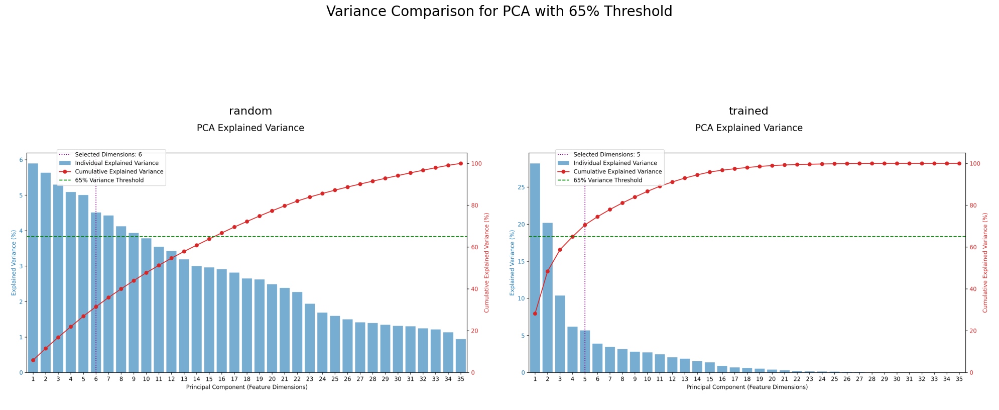

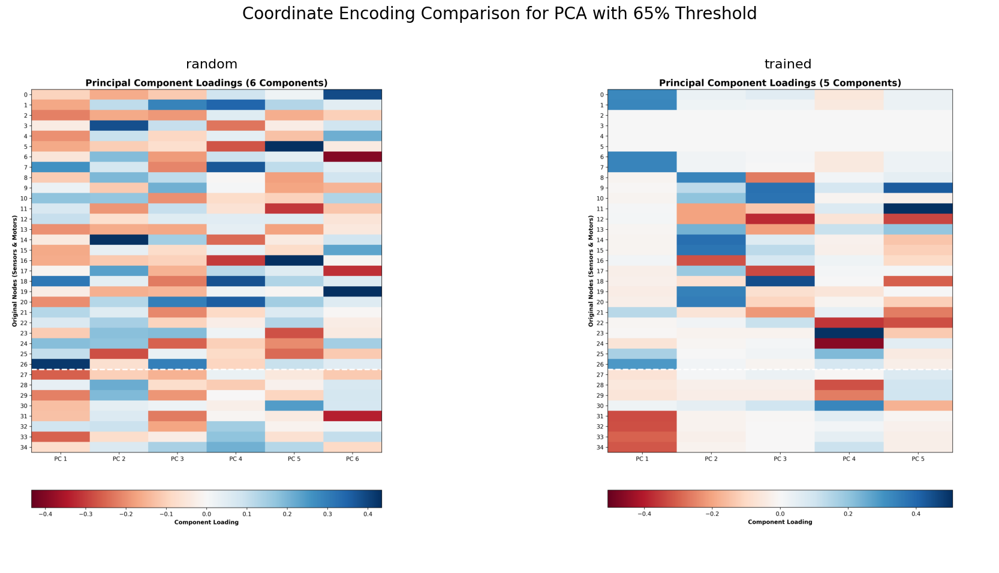

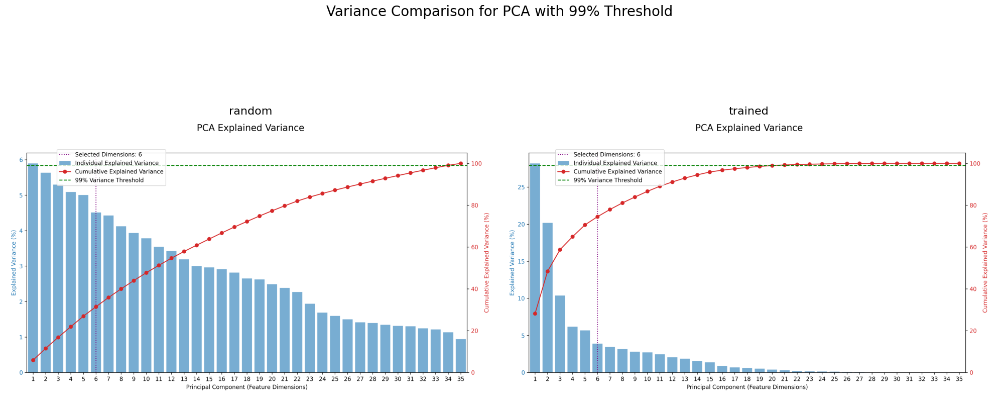

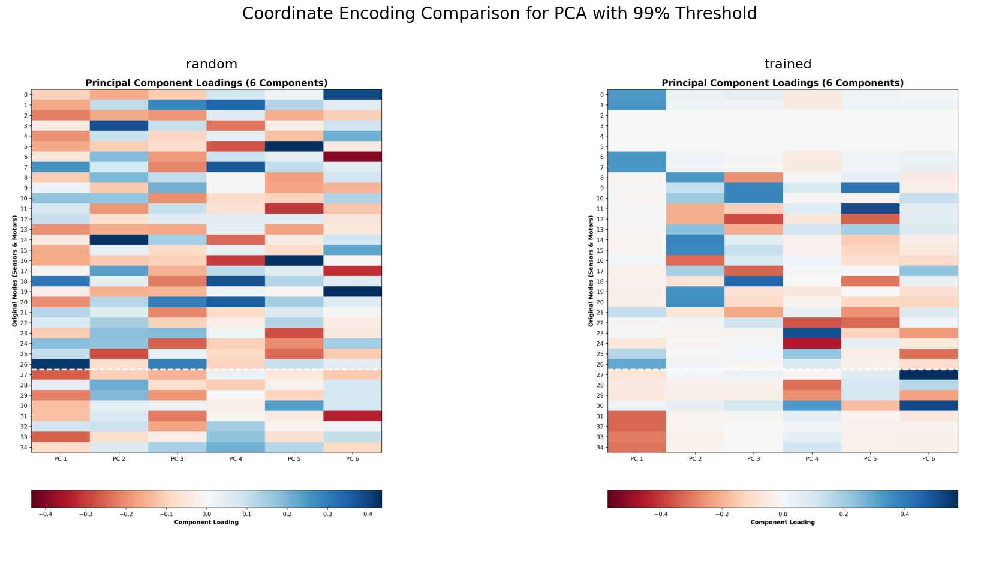

In [ ]:
pca_variances = [0.4, 0.5, 0.6, 0.7, 0.8, 0.9]

for data_label, data_array in data_sources.items():
    for variance in pca_variances:
        percentage = int(variance*100)
        print(f"Analyzing {data_label} sampling data")
        analyzer_pca = PCAanalyzer(
            data=data_array, 
            obs_size=obs_size, 
            act_size=act_size,
            variance_threshold=variance, 
            max_dims=config["data_analysis"]["max_dims"](obs_size),
            hidden_depth=config["substrate"]["hidden_depth"],
            width_factor=config["substrate"]["width_factor"]
        )
        input_coors_pca, output_coors_pca = analyzer_pca.generate_io_coordinates()
        generated_io_coors[data_label][f"pca{percentage}"]["input_coors"] = input_coors_pca
        generated_io_coors[data_label][f"pca{percentage}"]["output_coors"] = output_coors_pca
        analyzer_pca.plot_variance(save_path=f"{OUTPUT_DIR}/data_analysis/pca_variance_{percentage}_{data_label}.png")
        analyzer_pca.plot_principal_components(save_path=f"{OUTPUT_DIR}/data_analysis/pca_heatmap_{percentage}_{data_label}.png")
        print("\n")

for variance in pca_variances:
    percentage = int(variance*100)
    display_plots_side_by_side(
        plot_paths=[f"{OUTPUT_DIR}/data_analysis/pca_variance_{percentage}_random.png", f"{OUTPUT_DIR}/data_analysis/pca_variance_{percentage}_trained.png"],
        plot_titles=["random", "trained"],
        main_title=f"Variance Comparison for PCA with {percentage}% Threshold",
        save_path=f"{OUTPUT_DIR}/data_analysis/pca_variance_{percentage}_comparison.png"
    )
    display_plots_side_by_side(
        plot_paths=[f"{OUTPUT_DIR}/data_analysis/pca_heatmap_{percentage}_random.png", f"{OUTPUT_DIR}/data_analysis/pca_heatmap_{percentage}_trained.png"],
        plot_titles=["random", "trained"],
        main_title=f"Coordinate Encoding Comparison for PCA with {percentage}% Threshold",
        save_path=f"{OUTPUT_DIR}/data_analysis/pca_heatmap_{percentage}_comparison.png"
)

Analyzing trained sampling data
Running Sparse Dictionary Learning to find 6 dictionary atoms...
SDL complete. Extracting coordinates (loadings on dictionary atoms).
Applying width factor: 2
Added layering dimension. Final coordinate size: 7
Dictionary atoms heatmap saved to: output/ant/data_analysis/sdl_heatmap_trained.png


Analyzing random sampling data
Running Sparse Dictionary Learning to find 6 dictionary atoms...
SDL complete. Extracting coordinates (loadings on dictionary atoms).
Applying width factor: 2
Added layering dimension. Final coordinate size: 7
Dictionary atoms heatmap saved to: output/ant/data_analysis/sdl_heatmap_random.png




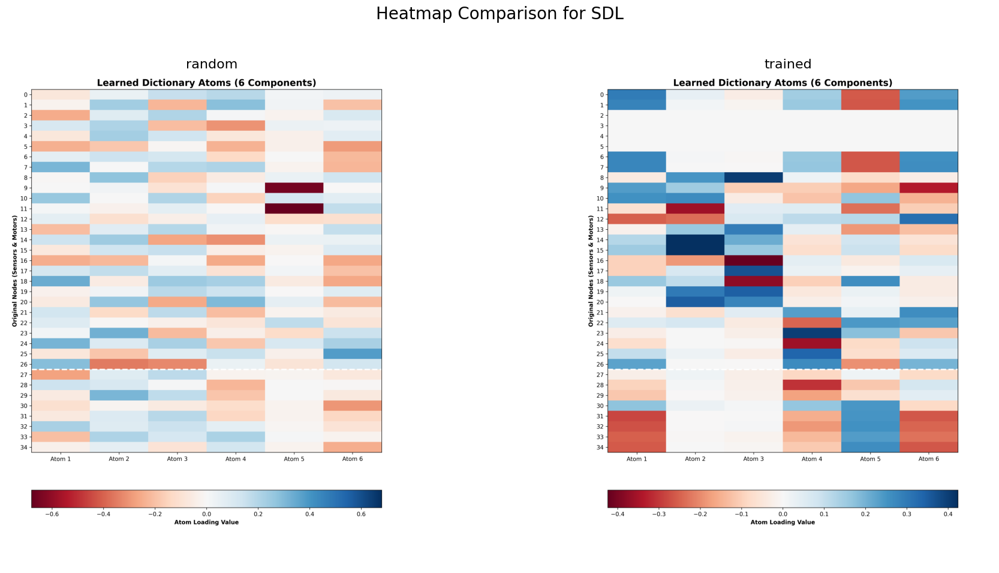

In [10]:
for data_label, data_array in data_sources.items():
    print(f"Analyzing {data_label} sampling data")
    analyzer_sdl = SparseDictionaryAnalyzer(
        data=data_array,
        obs_size=obs_size,
        act_size=act_size,
        max_dims=config["data_analysis"]["max_dims"](obs_size,),
        alpha=config["data_analysis"]["sdl_alpha"],
        max_iter=config["data_analysis"]["sdl_max_iter"],
        hidden_depth=config["substrate"]["hidden_depth"],
        width_factor=config["substrate"]["width_factor"]
    )
    input_coors_sdl, output_coors_sdl = analyzer_sdl.generate_io_coordinates()
    generated_io_coors[data_label]["sdl"]["input_coors"] = input_coors_sdl
    generated_io_coors[data_label]["sdl"]["output_coors"] = output_coors_sdl
    analyzer_sdl.plot_dictionary_atoms(save_path=f"{OUTPUT_DIR}/data_analysis/sdl_heatmap_{data_label}.png")
    print("\n")

display_plots_side_by_side(
    plot_paths=[f"{OUTPUT_DIR}/data_analysis/sdl_heatmap_random.png", f"{OUTPUT_DIR}/data_analysis/sdl_heatmap_trained.png"],
    plot_titles=["random", "trained"],
    main_title=f"Heatmap Comparison for SDL",
    save_path=f"{OUTPUT_DIR}/data_analysis/sdl_heatmap_comparison.png"
)

## Substrate Generation

Now it's time to generate the full substrates. The input and ouput nodes have already been generated above, so the hidden layers are the crucial part that's missing.

### Generating Hidden Layers

A `HiddenLayerGenerator` class is used to generate hidden nodes from the input node. There are of course, many ways these hidden nodes can be defined in the high-dimensional space. The class has a few options hard-coded:

* `one_hot`: This does a one-hot encoding of the dimensions, so there will be one coordinate for each dimension. E.g. for 3 Dimensions: (1,0,0),(0,1,0),(0,0,1)
* `one_double_hot`: This is the same as one-hot, but has two coordinates in every dimension, e.g. for 3 dimensions: (1,0,0),(0,1,0),(0,0,1),(2,0,0),(0,2,0),(0,0,2)
* `two_hot`: This adds all possible pairs of dimensions as coordinates to the one_hor ecoding, e.g. for 3 dimensions: (1,0,0),(0,1,0),(0,0,1),(1,1,0),(1,0,1),(0,1,1)
* `shift`: This schema takes all input nodes and simply "shifts" every one of them into the layering direction by 1 for each layer.
* `shift_two`: This does the same as `shift`, but doubles the number of nodes by adding duplicates where all the directions are multiplied by 2. This is like treating it as a vector and simply doubling it.

One important thing to notice is that the number of generated hidden nodes is highly dependent on the number of dimensions (one_hot/one_double_hot linear and two_hot exponential), except for the `shift` and `shift_two` methods.

In [11]:
hidden_layer_gen = HiddenLayerGenerator(
    env_name=env_name,
    obs_size=obs_size,
    act_size=act_size,
    hidden_layer_type=config["substrate"]["hidden_layer_type"],
    hidden_depth=config["substrate"]["hidden_depth"],
)

substrates = defaultdict(lambda: defaultdict(dict))

### Substrate from Manual Mapping

The next baseline represents a substrate which is "hand-crafted" by a human expert.

A `ManualInputMapper` class creates substrate coordinates from a mapping of semantically meaningful categories such as "front", "back", "velocity", "angle". Every substrate node can be sorted into multiple categories. One of multiple categories form a dimension. E.g. "angle" might be a single dimension on its own whereas "front" and "back" are two opposite directions in the same dimension. Accordingly every category maps to a vector in the respective dimension. Applying all the vectors for a node, e.g. "front", "left", "hip" and "angular velocity" for the input node "angular velocity of the front left hip", generates the coordinate (0, 0, 1, 0, 0, 0, 0, -1, 1, 1, 0, 0).

The manual mappings are are implemented for the following [Brax environments](https://github.com/google/brax/tree/main/brax/envs):
* ant
* halfcheetah
* swimmer

In [13]:
manual_mapper = ManualInputMapper(
    env_name=env_name,
    obs_size=obs_size,
    act_size=act_size,
    hidden_layer_type=config["substrate"]["hidden_layer_type"],
    hidden_depth=config["substrate"]["hidden_depth"],
    width_factor=config["substrate"]["width_factor"]
)
input_coors_manual, output_coors_manual = manual_mapper.generate_io_coordinates()
generated_io_coors["manual"]["mapping"]["input_coors"] = input_coors_manual
generated_io_coors["manual"]["mapping"]["output_coors"] = output_coors_manual

Using user-defined input and output mapping for 'ant'.
Number of feature dimensions: 10
Total number after adding output and layering dimensions (coord_size): 12
Number of output nodes: 8
Applying width factor: 2
Number of input nodes (obs + bias): 28


### Substrate from Data Analysis Results

Next, the input and output nodes created through data analysis are used to create substrates.

In [14]:
for data_label, data_dict in generated_io_coors.items():
    for method_label, method_dict in data_dict.items():

        input_coors = method_dict["input_coors"]
        output_coors = method_dict["output_coors"]
        hidden_coors = hidden_layer_gen.get_hidden_coors(input_coors=input_coors)
        generated_io_coors[data_label][method_label]["hidden_coors"] = hidden_coors

        substrates[data_label][method_label]["substrate"] = FullSubstrate(
            input_coors=input_coors,
            hidden_coors=hidden_coors,
            output_coors=output_coors,
        )

        substrates[data_label][method_label]["input_coors"] = input_coors
        substrates[data_label][method_label]["hidden_coors"] = hidden_coors
        substrates[data_label][method_label]["output_coors"] = output_coors

        # all input and output coordinates are logged for further analysis
        log_coors = method_dict["input_coors"]
        for coor in method_dict["output_coors"]:
            log_coors.append(coor)
        save_coordinates_to_csv(
            coordinates=log_coors,
            filepath=f"{OUTPUT_DIR}/coordinates/{data_label}_{method_label}_io.csv",
        )

Successfully saved coordinates to: output/ant/coordinates/trained_pca65_io.csv
Successfully saved coordinates to: output/ant/coordinates/trained_pca99_io.csv
Successfully saved coordinates to: output/ant/coordinates/trained_inv_pca__io.csv
Successfully saved coordinates to: output/ant/coordinates/trained_fa_io.csv
Successfully saved coordinates to: output/ant/coordinates/trained_sdl_io.csv
Successfully saved coordinates to: output/ant/coordinates/random_pca65_io.csv
Successfully saved coordinates to: output/ant/coordinates/random_pca99_io.csv
Successfully saved coordinates to: output/ant/coordinates/random_inv_pca__io.csv
Successfully saved coordinates to: output/ant/coordinates/random_fa_io.csv
Successfully saved coordinates to: output/ant/coordinates/random_sdl_io.csv
Successfully saved coordinates to: output/ant/coordinates/manual_mapping_io.csv


## Neuroevolution

Finally the substrates are ready to be used for neuroevolution with HyperNEAT.


wandb: Currently logged in as: wirkelzirkel (wirkelzirkel-iu) to https://api.wandb.ai. Use `wandb login --relogin` to force relogin


initializing
initializing finished
start compile
compile finished, cost time: 33.552289s
Generation: 1, Cost time: 5736.20ms
 	fitness: valid cnt: 600, max: 50.7186, min: -167.6658, mean: -75.4439, std: 39.4512

	node counts: max: 7, min: 5, mean: 6.08
 	conn counts: max: 7, min: 0, mean: 4.49
 	species: 15, [117, 5, 5, 182, 2, 2, 60, 1, 1, 1, 43, 4, 1, 1, 175]

Generation: 2, Cost time: 5671.19ms
 	fitness: valid cnt: 600, max: 53.0168, min: -148.3798, mean: -34.9684, std: 60.4322

	node counts: max: 8, min: 5, mean: 6.03
 	conn counts: max: 7, min: 0, mean: 3.70
 	species: 15, [96, 88, 84, 28, 52, 14, 3, 3, 16, 11, 9, 4, 4, 1, 187]

Generation: 3, Cost time: 5728.53ms
 	fitness: valid cnt: 600, max: 51.8322, min: -129.6215, mean: -0.9463, std: 61.2482

	node counts: max: 9, min: 5, mean: 5.98
 	conn counts: max: 8, min: 0, mean: 3.31
 	species: 15, [35, 104, 57, 38, 55, 46, 33, 3, 1, 9, 15, 10, 6, 6, 182]

Generation: 4, Cost time: 5670.29ms
 	fitness: valid cnt: 600, max: 56.9897, m

fitness_max,▁▁▂▂▁▁▁▁▁▄▆▆▇▆▆▆▆▆▆▆▇▆▇▆▇▇▇▇█▇█▇█▇█▇▇▇██
fitness_mean,██▇▇▆▄▄▄▃▄▅▅▅▅▅▄▄▄▅▄▄▃▂▂▃▂▂▂▃▃▁▃▂▁▂▂▂▂▁▂
fitness_min,▅▆▅▇▄▂▅▆▅▇▆█▆▅▅▆▅▃▄▃▅▅▅▅▃▅▅▆▅▄▅▆▁▄▄▃▆▄▅▅
fitness_std,▄▂▃▃▃▃▃▃▃▂▁▃▄▄▅▅▆▅▆▆▆▅▅▆▆█████████▇█▇███
generation,▁▁▂▂▂▂▃▃▃▃▃▃▃▃▃▄▄▄▄▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇█
fitness_max,112.67744
fitness_mean,-8.64927
fitness_min,-143.76921
fitness_std,70.34598
generation,400


Total reward:  103.9829


/home/andi/anaconda3/envs/jax/lib/python3.10/subprocess.py:1796: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = _posixsubprocess.fork_exec(


mp4 saved to:  output/ant/video/agent_manual_simple.mp4
Visualizing CPPN. Saving to output/ant/topology/cppn_manual_simple.svg.
Manually reconstructing the phenotype. A visual layout will be generated.
Substrate has 4860 potential connections.
Visualizing 417 connections. Excluded loops. Weight threshold: 0.1


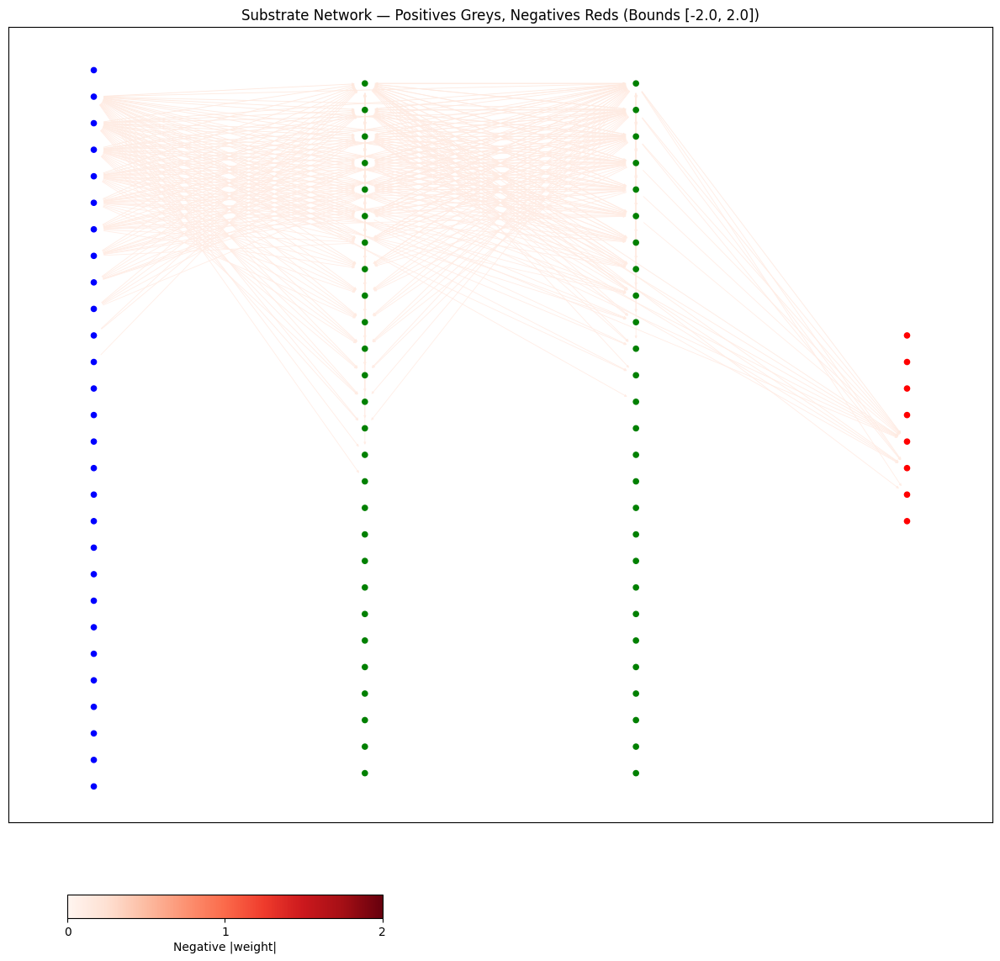

Visualization saved to: output/ant/topology/nn_manual_simple.svg


initializing
initializing finished
start compile


2025-09-08 22:41:40.694054: W external/xla/xla/hlo/transforms/simplifiers/hlo_rematerialization.cc:3023] Can't reduce memory use below 10.99GiB (11797747132 bytes) by rematerialization; only reduced to 15.29GiB (16423000088 bytes), down from 15.73GiB (16894859312 bytes) originally


compile finished, cost time: 30.903058s
Generation: 1, Cost time: 8796.86ms
 	fitness: valid cnt: 600, max: 19.4283, min: -138.6191, mean: -60.5377, std: 41.9839

	node counts: max: 32, min: 30, mean: 31.08
 	conn counts: max: 152, min: 124, mean: 146.57
 	species: 10, [230, 49, 46, 20, 15, 42, 35, 102, 21, 40]

Generation: 2, Cost time: 8800.64ms
 	fitness: valid cnt: 600, max: 24.0070, min: -152.3414, mean: -53.1678, std: 42.3495

	node counts: max: 33, min: 29, mean: 31.02
 	conn counts: max: 153, min: 99, mean: 140.80
 	species: 15, [29, 49, 40, 44, 70, 48, 49, 16, 23, 147, 24, 5, 6, 7, 43]

Generation: 3, Cost time: 8847.66ms
 	fitness: valid cnt: 600, max: 25.9503, min: -139.3519, mean: -42.9719, std: 43.1587

	node counts: max: 33, min: 29, mean: 31.30
 	conn counts: max: 154, min: 98, mean: 139.55
 	species: 15, [84, 70, 55, 58, 50, 39, 36, 25, 23, 48, 54, 21, 11, 7, 19]

Generation: 4, Cost time: 8843.20ms
 	fitness: valid cnt: 600, max: 30.9344, min: -159.7731, mean: -33.0519

fitness_max,▁▁▁▁▁▁▁▂▂▃▃▄▄▆▅▆▇▇▆▇▆▆▆▅▇▇▆▇▇▇▇▇▇██▇████
fitness_mean,▁▁▁▂▂▂▂▂▃▄▄▄▅▅▆▆▆▆▆▆▇▆▅▅▇▆▆▆▇▆▇▇▇▆▇▇▆▆▆█
fitness_min,▇██▇█████████▇▇▆▇▇▇▇███▇████▅█▇▇▇██▇▇▁█▆
fitness_std,▁▁▁▁▁▂▁▂▂▂▂▂▂▃▃▃▃▄▄▅▅▅▄▅▄▆▅▅▆▆▆▆▇▇▇▇▇▇█▇
generation,▁▁▁▁▁▂▂▂▂▃▃▃▃▃▃▃▃▄▄▄▅▅▅▅▅▆▆▆▆▆▆▆▇▇▇▇████
fitness_max,601.4303
fitness_mean,51.67479
fitness_min,-203.97099
fitness_std,133.92499
generation,400


Total reward:  5.590679


/home/andi/anaconda3/envs/jax/lib/python3.10/subprocess.py:1796: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = _posixsubprocess.fork_exec(


mp4 saved to:  output/ant/video/agent_manual_mapping.mp4
Visualizing CPPN. Saving to output/ant/topology/cppn_manual_mapping.svg.
Manually reconstructing the phenotype. A visual layout will be generated.
Substrate has 8892 potential connections.
Visualizing 1508 connections. Excluded loops. Weight threshold: 0.1


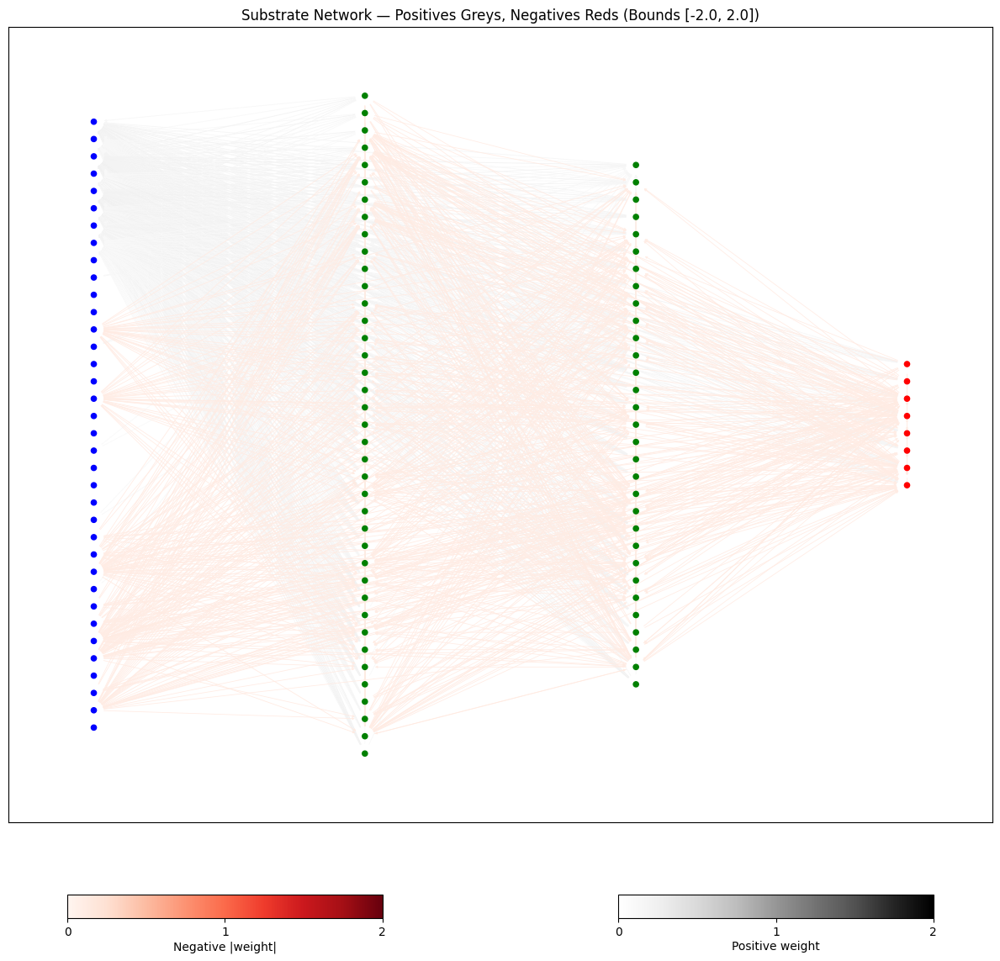

Visualization saved to: output/ant/topology/nn_manual_mapping.svg


initializing
initializing finished
start compile


2025-09-08 23:44:33.070994: W external/xla/xla/hlo/transforms/simplifiers/hlo_rematerialization.cc:3023] Can't reduce memory use below 10.99GiB (11797747132 bytes) by rematerialization; only reduced to 11.64GiB (12496913340 bytes), down from 12.08GiB (12968772640 bytes) originally


compile finished, cost time: 31.377855s
Generation: 1, Cost time: 6593.62ms
 	fitness: valid cnt: 600, max: 51.2937, min: -147.4589, mean: -80.0858, std: 34.1901

	node counts: max: 17, min: 15, mean: 16.08
 	conn counts: max: 41, min: 25, mean: 37.31
 	species: 15, [229, 19, 29, 25, 4, 21, 11, 35, 34, 53, 38, 23, 13, 29, 37]

Generation: 2, Cost time: 6594.18ms
 	fitness: valid cnt: 600, max: 51.7255, min: -137.3059, mean: -68.7072, std: 40.7448

	node counts: max: 18, min: 14, mean: 16.04
 	conn counts: max: 42, min: 12, mean: 35.78
 	species: 15, [14, 65, 34, 54, 46, 12, 35, 114, 30, 26, 36, 55, 15, 19, 45]

Generation: 3, Cost time: 6621.70ms
 	fitness: valid cnt: 600, max: 167.9976, min: -136.7157, mean: -47.7355, std: 49.5535

	node counts: max: 18, min: 13, mean: 15.96
 	conn counts: max: 42, min: 0, mean: 33.63
 	species: 15, [71, 57, 46, 113, 45, 33, 7, 22, 16, 34, 22, 28, 17, 11, 78]

Generation: 4, Cost time: 6626.87ms
 	fitness: valid cnt: 600, max: 125.2120, min: -141.0650

fitness_max,▁▂▃▃▄▅▆▅▇▄█▆▅▇▆▇▆▅▅██▅█▆▆▆▇▆▆█▆▅▇▆▇▆▆▆▆█
fitness_mean,▁▂▄▄▅▅▇▇▆▆▇▇▇▆▆▇▇▅▆▆▆▇▇▇█▇▇▆▇▆▆▆▅█▇█▇▇▇█
fitness_min,▅▆▅▅▆▅▆▁▆█▇▆▆▆▇▅▂▇▆▄▆▇▄▅▅▇▆▄▂▆▄▆▇▄▆▇▇▆▆▆
fitness_std,▁▁▃▄▄▄▄▅▅▅▆▇▇▆▇▇▆▇▆▅▆▆▇▆▆▇▇▇▆█▅▆▇█▇█▇█▇█
generation,▁▁▁▁▁▂▂▂▂▃▃▃▃▃▃▃▄▄▄▄▅▅▅▆▆▆▆▆▇▇▇▇▇▇▇▇████
fitness_max,441.30368
fitness_mean,57.96613
fitness_min,-136.23802
fitness_std,115.1085
generation,400


Total reward:  367.31503


/home/andi/anaconda3/envs/jax/lib/python3.10/subprocess.py:1796: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = _posixsubprocess.fork_exec(


mp4 saved to:  output/ant/video/agent_trained_pca65.mp4
Visualizing CPPN. Saving to output/ant/topology/cppn_trained_pca65.svg.
Manually reconstructing the phenotype. A visual layout will be generated.
Substrate has 6732 potential connections.
Visualizing 2725 connections. Excluded loops. Weight threshold: 0.1


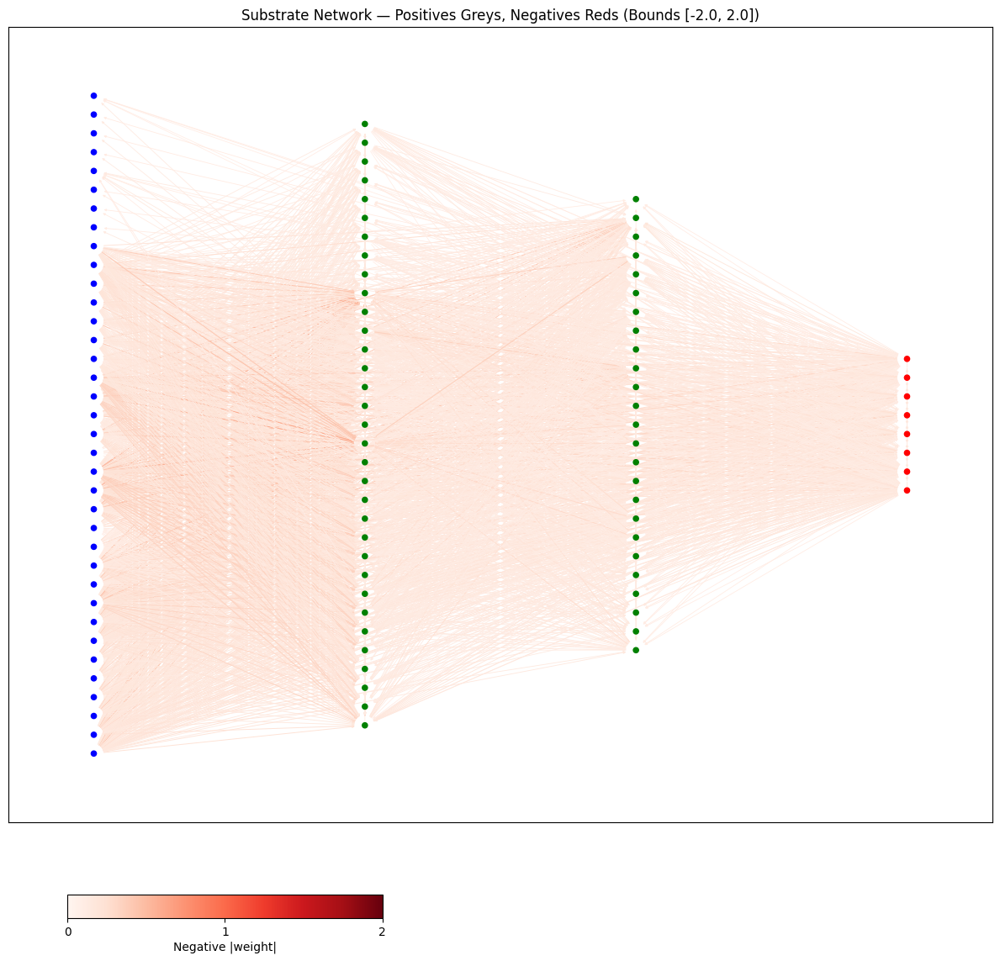

Visualization saved to: output/ant/topology/nn_trained_pca65.svg


initializing
initializing finished
start compile


2025-09-09 00:33:43.597599: W external/xla/xla/hlo/transforms/simplifiers/hlo_rematerialization.cc:3023] Can't reduce memory use below 10.99GiB (11797747132 bytes) by rematerialization; only reduced to 12.17GiB (13067284088 bytes), down from 12.61GiB (13539143312 bytes) originally


compile finished, cost time: 31.264323s
Generation: 1, Cost time: 6907.25ms
 	fitness: valid cnt: 600, max: 22.3885, min: -152.2078, mean: -80.7988, std: 31.6328

	node counts: max: 19, min: 17, mean: 18.08
 	conn counts: max: 47, min: 29, mean: 43.03
 	species: 15, [259, 10, 20, 69, 55, 3, 17, 23, 12, 30, 10, 22, 14, 16, 40]

Generation: 2, Cost time: 6884.40ms
 	fitness: valid cnt: 600, max: 49.6785, min: -142.3325, mean: -70.8929, std: 37.2203

	node counts: max: 20, min: 16, mean: 18.05
 	conn counts: max: 47, min: 15, mean: 40.83
 	species: 15, [38, 74, 43, 25, 76, 38, 38, 22, 29, 26, 37, 63, 44, 10, 37]

Generation: 3, Cost time: 6920.55ms
 	fitness: valid cnt: 600, max: 66.3512, min: -141.5826, mean: -50.9873, std: 45.7391

	node counts: max: 21, min: 15, mean: 17.92
 	conn counts: max: 48, min: 0, mean: 37.31
 	species: 15, [79, 80, 51, 39, 46, 45, 14, 24, 10, 15, 54, 18, 22, 33, 70]

Generation: 4, Cost time: 6948.91ms
 	fitness: valid cnt: 600, max: 76.4199, min: -142.2491, m

fitness_max,▁▂▄▄▄▄▅▅▇▆▇▇▇▇▆▇▇█▇▇▇█▇█▇█▇▇▇▆▇▇▇▇▇▇▇▇▇▆
fitness_mean,▁▁▁▂▃▅▅▆▅▆▆▆▅▅▅▆▆▆▇▆▅▅▆▆▇▇█▇▇▇▇▇▇▇▇▇▇▇█▇
fitness_min,▆▅▄▆▅▆▅▆▆▅█▇▅▆▇▂▆▆▇▆▅▅▁▆▆▆▆▅▅▆█▆▅▅▆█▆▆█▆
fitness_std,▁▁▂▂▂▃▃▃▅▅▅▄▅▅▆▆▅▆▅▆▆▆▆▇▇▇▆▇▇▇▇▇▇▇▇▇█▇█▇
generation,▁▁▁▁▁▂▂▂▂▂▃▃▃▃▃▄▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▆▆▇▇▇▇██
fitness_max,356.90552
fitness_mean,78.69072
fitness_min,-143.38914
fitness_std,102.78346
generation,400


Total reward:  180.048


/home/andi/anaconda3/envs/jax/lib/python3.10/subprocess.py:1796: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = _posixsubprocess.fork_exec(


mp4 saved to:  output/ant/video/agent_trained_pca99.mp4
Visualizing CPPN. Saving to output/ant/topology/cppn_trained_pca99.svg.
Manually reconstructing the phenotype. A visual layout will be generated.
Substrate has 7072 potential connections.
Visualizing 2559 connections. Excluded loops. Weight threshold: 0.1


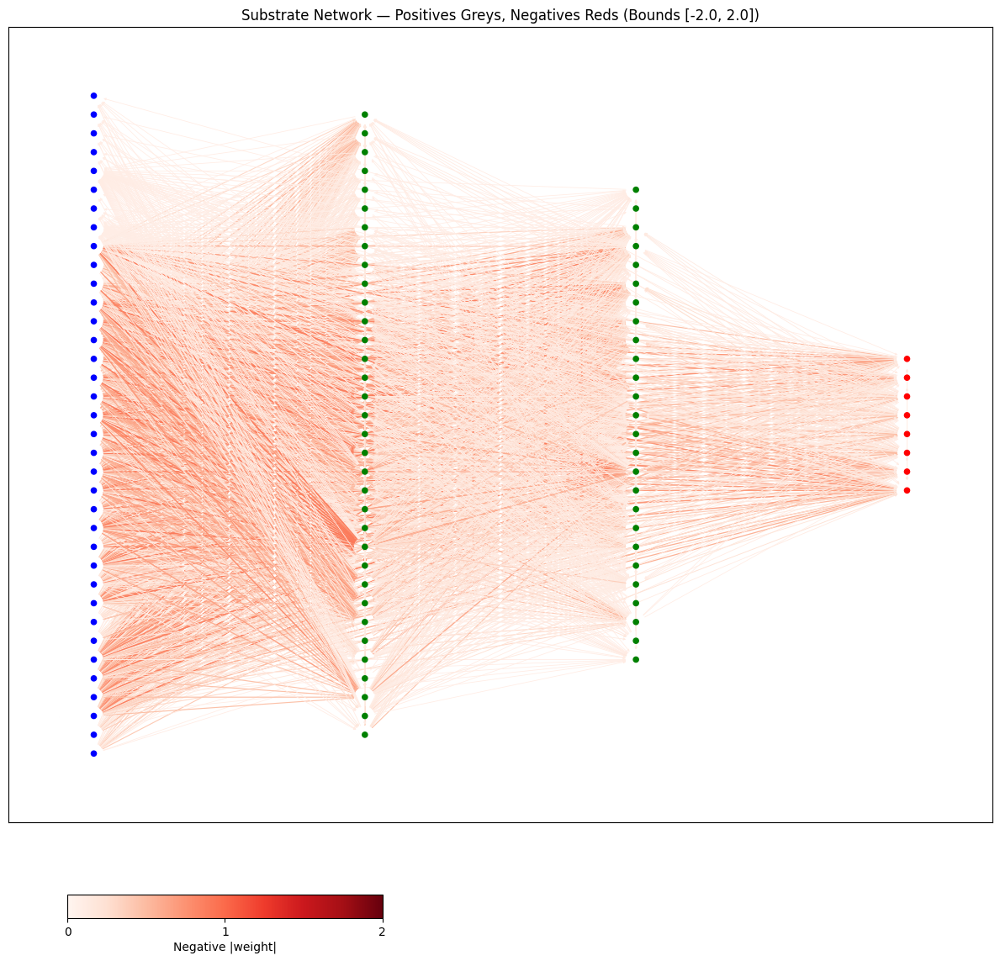

Visualization saved to: output/ant/topology/nn_trained_pca99.svg


initializing
initializing finished
start compile


2025-09-09 01:23:15.539188: W external/xla/xla/hlo/transforms/simplifiers/hlo_rematerialization.cc:3023] Can't reduce memory use below 10.99GiB (11797747132 bytes) by rematerialization; only reduced to 12.17GiB (13067284088 bytes), down from 12.61GiB (13539143312 bytes) originally


compile finished, cost time: 31.929426s
Generation: 1, Cost time: 6891.63ms
 	fitness: valid cnt: 600, max: 49.2375, min: -148.4653, mean: -85.7685, std: 27.3206

	node counts: max: 19, min: 17, mean: 18.08
 	conn counts: max: 47, min: 29, mean: 43.03
 	species: 15, [361, 16, 6, 11, 21, 21, 15, 15, 16, 10, 23, 19, 28, 9, 29]

Generation: 2, Cost time: 6879.39ms
 	fitness: valid cnt: 600, max: 50.8849, min: -155.7304, mean: -78.6065, std: 35.4546

	node counts: max: 20, min: 16, mean: 17.93
 	conn counts: max: 48, min: 14, mean: 39.39
 	species: 15, [85, 87, 12, 38, 11, 3, 40, 29, 61, 78, 19, 26, 30, 4, 77]

Generation: 3, Cost time: 6919.09ms
 	fitness: valid cnt: 600, max: 52.2436, min: -157.4685, mean: -50.7805, std: 55.0966

	node counts: max: 21, min: 15, mean: 17.73
 	conn counts: max: 48, min: 0, mean: 36.02
 	species: 15, [3, 68, 49, 5, 90, 51, 35, 9, 28, 28, 27, 16, 19, 9, 163]

Generation: 4, Cost time: 6946.16ms
 	fitness: valid cnt: 600, max: 54.7157, min: -142.8088, mean: -

fitness_max,▁▂█▆▅▅▅▅▅▆▆▆▆▇▆█▇▆▆▆▆▇▇▇▆▆▆▆▇▇▇▇██▇▆▇▇▇▇
fitness_mean,▁▄▄▃▄▄▄▅▅▅▄▅▅▄▄▅▆▆▆▅▆▆▆▆▇▇▇▇▇█████▇▇▇▇▆▆
fitness_min,▂▅▅▅▄▆▇▆▆▅▇▆▃▇▆▅▆▇▄▅▇▇▃▄▅▆▆▅▅▇▆▇█▇▇▆▇▅▁▆
fitness_std,▁▆▆▆▆▆▅▆▆▆▇▇▇▇█▇██▇▇▇█▇▇▇▇▇▇▇▇▇▆▆▇▇▇▆▇▇█
generation,▁▁▁▂▂▂▂▂▂▂▃▃▃▃▃▄▄▄▄▅▅▅▅▅▅▅▅▅▆▆▆▆▆▆▇▇▇▇██
fitness_max,193.14841
fitness_mean,63.5874
fitness_min,-125.6677
fitness_std,73.27031
generation,400


Total reward:  182.93298


/home/andi/anaconda3/envs/jax/lib/python3.10/subprocess.py:1796: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = _posixsubprocess.fork_exec(


mp4 saved to:  output/ant/video/agent_trained_inv_pca_.mp4
Visualizing CPPN. Saving to output/ant/topology/cppn_trained_inv_pca_.svg.
Manually reconstructing the phenotype. A visual layout will be generated.
Substrate has 7072 potential connections.
Visualizing 5986 connections. Excluded loops. Weight threshold: 0.1


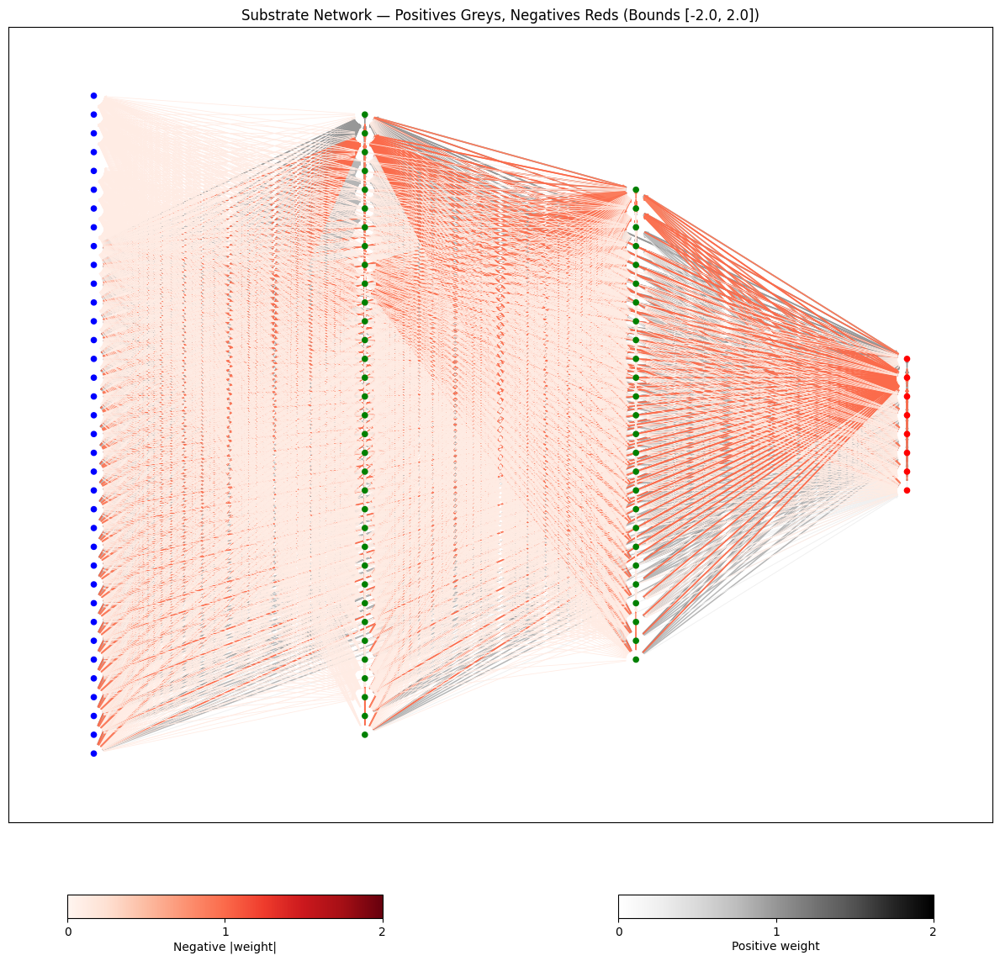

Visualization saved to: output/ant/topology/nn_trained_inv_pca_.svg


initializing
initializing finished
start compile


2025-09-09 02:13:36.533043: W external/xla/xla/hlo/transforms/simplifiers/hlo_rematerialization.cc:3023] Can't reduce memory use below 10.99GiB (11797747132 bytes) by rematerialization; only reduced to 12.17GiB (13067284088 bytes), down from 12.61GiB (13539143312 bytes) originally


compile finished, cost time: 32.113108s
Generation: 1, Cost time: 6887.04ms
 	fitness: valid cnt: 600, max: 5.3278, min: -155.6250, mean: -80.0519, std: 31.6182

	node counts: max: 19, min: 17, mean: 18.08
 	conn counts: max: 47, min: 29, mean: 43.03
 	species: 15, [168, 178, 6, 9, 12, 2, 23, 13, 54, 18, 17, 14, 9, 16, 61]

Generation: 2, Cost time: 6881.00ms
 	fitness: valid cnt: 600, max: 33.0009, min: -141.5294, mean: -68.8495, std: 37.2513

	node counts: max: 20, min: 16, mean: 18.05
 	conn counts: max: 48, min: 14, mean: 40.99
 	species: 15, [73, 45, 62, 75, 115, 46, 31, 16, 35, 20, 2, 7, 13, 27, 33]

Generation: 3, Cost time: 6913.22ms
 	fitness: valid cnt: 600, max: 45.0224, min: -138.5836, mean: -49.6210, std: 43.5835

	node counts: max: 20, min: 16, mean: 17.75
 	conn counts: max: 49, min: 13, mean: 36.51
 	species: 15, [43, 34, 67, 30, 3, 37, 27, 25, 88, 58, 39, 13, 13, 3, 120]

Generation: 4, Cost time: 6908.85ms
 	fitness: valid cnt: 600, max: 89.2259, min: -135.8082, mean:

fitness_max,▁▁▆▅▄▅▅▆▅▅▅▆▅▅▆▅▆▆▅▆▇▅▆█▅▇▆▆▆▇▇▆▇▆▇▆█▆▆▆
fitness_mean,▁▂▃▄▄▅▄▅▆▆▆▅▆▇▇▇▇▇█▇████▇▇▇▇▇▇▇▇▆▇▇▇▇█▇▇
fitness_min,▇▇▇██▇▇█▇▆▇▄▄▇▆▇▆▄▅▅▄▇▇█▆▄▁▄█▆▇▆▇▄▅▁▆▄▅▅
fitness_std,▁▃▄▆▆▅▅▄▆▇▇▇██▇▇▇█▇█▇▇▇▇█▇██▇██▇▇▇▇▇▇███
generation,▁▁▁▁▂▂▂▂▂▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▆▆▆▆▆▇▇███
fitness_max,414.45474
fitness_mean,68.00166
fitness_min,-128.91937
fitness_std,108.56736
generation,400


Total reward:  351.54535


/home/andi/anaconda3/envs/jax/lib/python3.10/subprocess.py:1796: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = _posixsubprocess.fork_exec(


mp4 saved to:  output/ant/video/agent_trained_fa.mp4
Visualizing CPPN. Saving to output/ant/topology/cppn_trained_fa.svg.
Manually reconstructing the phenotype. A visual layout will be generated.
Substrate has 7072 potential connections.
Visualizing 2656 connections. Excluded loops. Weight threshold: 0.1


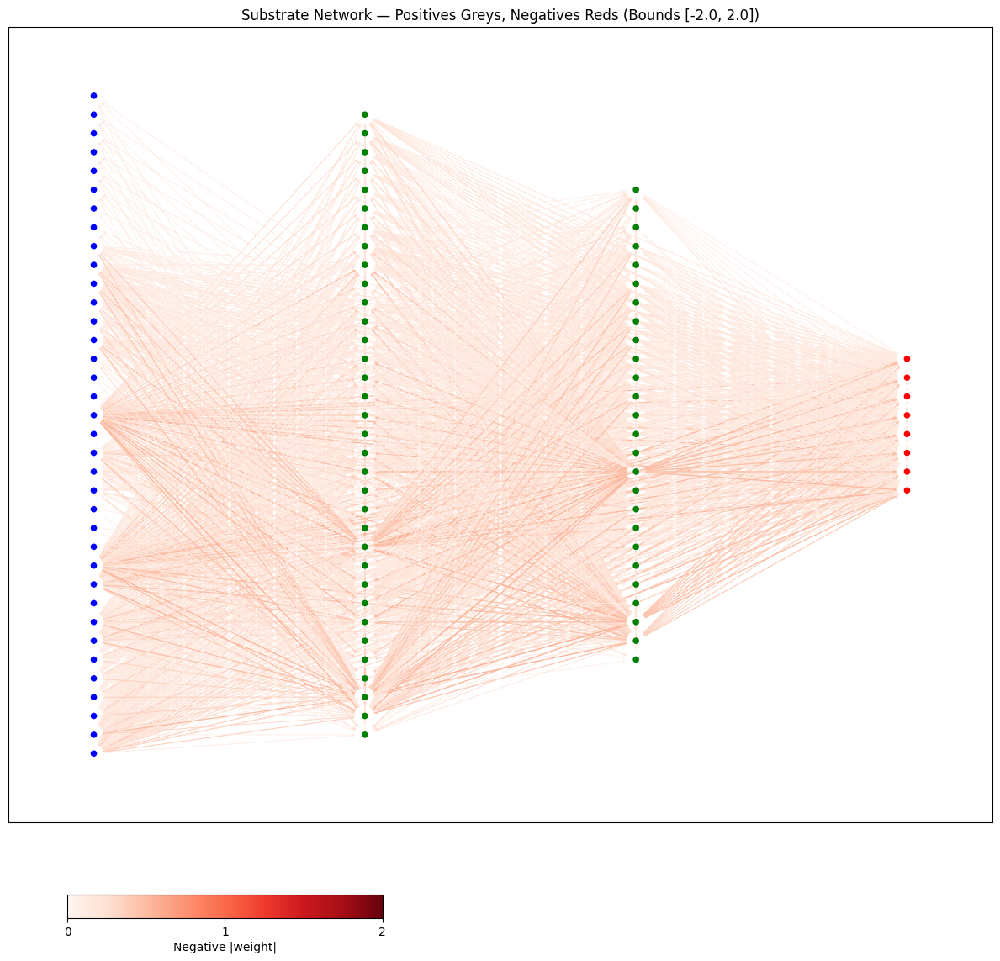

Visualization saved to: output/ant/topology/nn_trained_fa.svg


initializing
initializing finished
start compile


2025-09-09 03:03:14.665128: W external/xla/xla/hlo/transforms/simplifiers/hlo_rematerialization.cc:3023] Can't reduce memory use below 10.99GiB (11797747132 bytes) by rematerialization; only reduced to 12.17GiB (13067284088 bytes), down from 12.61GiB (13539143312 bytes) originally


compile finished, cost time: 32.330109s
Generation: 1, Cost time: 6885.02ms
 	fitness: valid cnt: 600, max: 50.0781, min: -152.4419, mean: -82.2133, std: 31.8337

	node counts: max: 19, min: 17, mean: 18.08
 	conn counts: max: 47, min: 29, mean: 43.03
 	species: 15, [309, 6, 5, 74, 17, 15, 50, 21, 30, 24, 16, 7, 10, 6, 10]

Generation: 2, Cost time: 6883.53ms
 	fitness: valid cnt: 600, max: 51.1892, min: -150.0026, mean: -72.4957, std: 37.7592

	node counts: max: 20, min: 16, mean: 17.93
 	conn counts: max: 48, min: 13, mean: 38.43
 	species: 15, [42, 72, 44, 40, 6, 41, 112, 89, 16, 34, 39, 11, 19, 8, 27]

Generation: 3, Cost time: 6910.39ms
 	fitness: valid cnt: 600, max: 52.5567, min: -145.0435, mean: -52.1271, std: 48.0356

	node counts: max: 20, min: 16, mean: 17.78
 	conn counts: max: 49, min: 1, mean: 34.48
 	species: 15, [65, 60, 12, 64, 40, 66, 53, 30, 23, 27, 33, 19, 20, 21, 67]

Generation: 4, Cost time: 6914.74ms
 	fitness: valid cnt: 600, max: 61.0530, min: -145.1259, mean:

fitness_max,▁▂▄▃▅▄▆▅▆▆▇▆▆▆▇▆▇▇▇▇▇█▇▇▇█▇▇▇▇▇▇▇▇▇▇██▇█
fitness_mean,▁▄▅▅▅▆▇▇▇▇▇▇▇▇▇▆▇▇▇▇▇▆▇▆▇▇▇▇▇▇▇█▇█▇█▇█▇█
fitness_min,▇▇█▅▄▃▅▆▃▄▇▄▄▇▅▃▅▄▇▃▄▅▅▄▁▃▅▄▃▄▆▃▄▅▃▄▅▄█▆
fitness_std,▁▃▄▄▄▄▆▆▆▇▆▇▆▇▇▇▇▇▇▆▇▇▇▇▇▇▇▇▇▇▇▇██▇██▇█▇
generation,▁▁▁▂▂▂▂▂▂▃▃▄▄▄▄▄▄▄▄▄▅▅▅▆▆▆▆▇▇▇▇▇▇▇██████
fitness_max,313.82779
fitness_mean,38.65992
fitness_min,-145.18431
fitness_std,123.60103
generation,400


Total reward:  198.24129


/home/andi/anaconda3/envs/jax/lib/python3.10/subprocess.py:1796: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = _posixsubprocess.fork_exec(


mp4 saved to:  output/ant/video/agent_trained_sdl.mp4
Visualizing CPPN. Saving to output/ant/topology/cppn_trained_sdl.svg.
Manually reconstructing the phenotype. A visual layout will be generated.
Substrate has 7072 potential connections.
Visualizing 5210 connections. Excluded loops. Weight threshold: 0.1


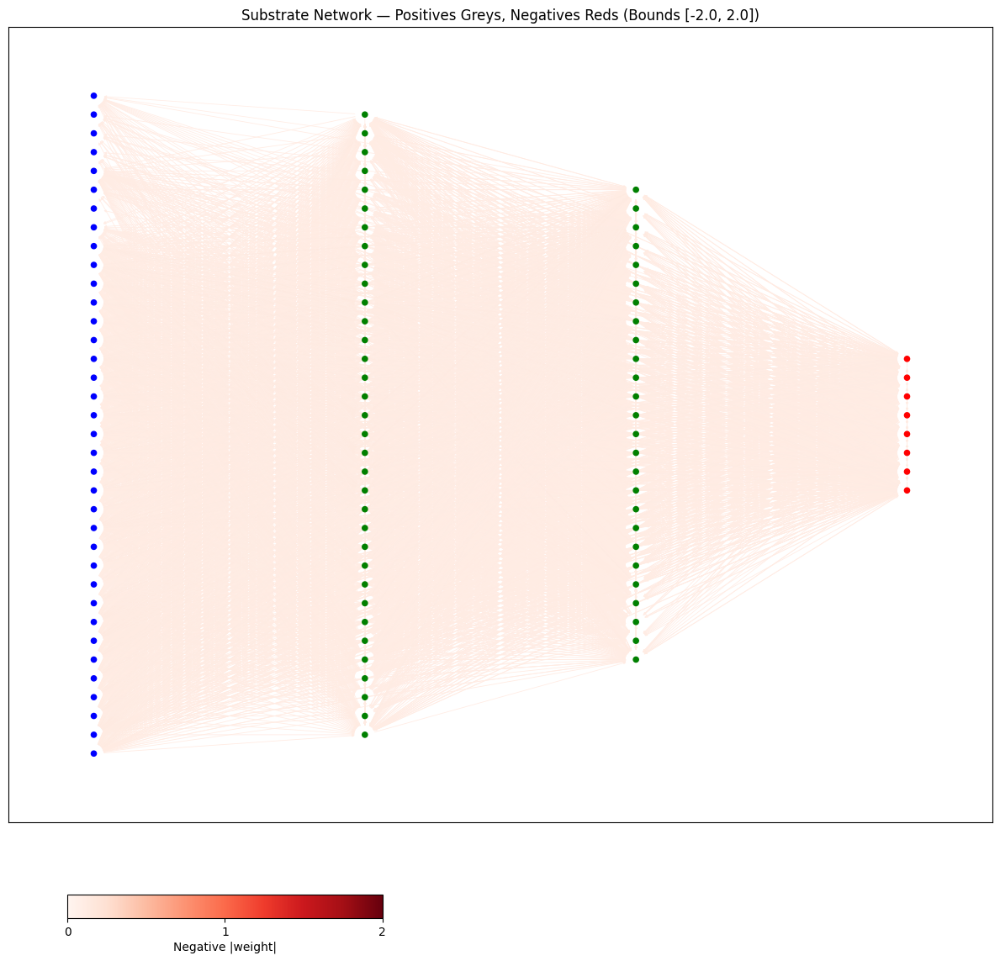

Visualization saved to: output/ant/topology/nn_trained_sdl.svg


initializing
initializing finished
start compile


2025-09-09 03:52:34.133839: W external/xla/xla/hlo/transforms/simplifiers/hlo_rematerialization.cc:3023] Can't reduce memory use below 10.99GiB (11797747132 bytes) by rematerialization; only reduced to 12.17GiB (13067284088 bytes), down from 12.61GiB (13539143312 bytes) originally


compile finished, cost time: 32.610606s
Generation: 1, Cost time: 6888.62ms
 	fitness: valid cnt: 600, max: 24.0298, min: -148.2381, mean: -80.6762, std: 32.2043

	node counts: max: 19, min: 17, mean: 18.08
 	conn counts: max: 47, min: 29, mean: 43.03
 	species: 15, [251, 17, 10, 23, 36, 45, 28, 66, 30, 15, 3, 13, 22, 10, 31]

Generation: 2, Cost time: 6880.88ms
 	fitness: valid cnt: 600, max: 50.2141, min: -137.0272, mean: -72.6521, std: 37.7729

	node counts: max: 20, min: 16, mean: 18.13
 	conn counts: max: 48, min: 15, mean: 42.20
 	species: 15, [87, 51, 13, 31, 40, 26, 30, 45, 72, 65, 54, 14, 30, 4, 38]

Generation: 3, Cost time: 6910.81ms
 	fitness: valid cnt: 600, max: 137.8584, min: -136.9420, mean: -50.9837, std: 43.1360

	node counts: max: 21, min: 16, mean: 18.38
 	conn counts: max: 49, min: 14, mean: 41.56
 	species: 15, [72, 18, 43, 32, 38, 53, 89, 52, 15, 8, 24, 23, 28, 6, 99]

Generation: 4, Cost time: 6947.85ms
 	fitness: valid cnt: 600, max: 90.6839, min: -140.4364, me

fitness_max,▁▁▁▂▃▂▃▃▅▄▄▆▇▆▆▆▇▇█▇▇▇▇▇▇▇▇▇▇█▇▇▇█▇█▇██▇
fitness_mean,▁▁▁▂▄▄▄▄▅▅▄▅▅▆▅▄▄▅▅▅▅▄▆▇▇▆▆▆▆▆▇▇▇▆█▇▇█▇▅
fitness_min,▆▇▆▆██▇▇▆█▇▆▇▇▇█▆█▇█▇▄▇▇▇█▆█▇▇▇▃▇▇██▇██▁
fitness_std,▁▃▃▃▃▄▄▄▆▆▆▆▆▆▅▆▅▆▇▇▇▇▇▇▇▇▆▇▇█▇███▇██▇█▆
generation,▁▁▁▁▁▂▂▂▂▂▃▃▃▃▃▄▄▄▄▄▄▄▄▄▄▅▅▅▅▅▆▆▆▆▆▇▇▇▇█
fitness_max,569.37738
fitness_mean,51.38433
fitness_min,-216.15433
fitness_std,131.49142
generation,400


Total reward:  326.97372


/home/andi/anaconda3/envs/jax/lib/python3.10/subprocess.py:1796: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = _posixsubprocess.fork_exec(


mp4 saved to:  output/ant/video/agent_random_pca65.mp4
Visualizing CPPN. Saving to output/ant/topology/cppn_random_pca65.svg.
Manually reconstructing the phenotype. A visual layout will be generated.
Substrate has 7072 potential connections.
Visualizing 1316 connections. Excluded loops. Weight threshold: 0.1


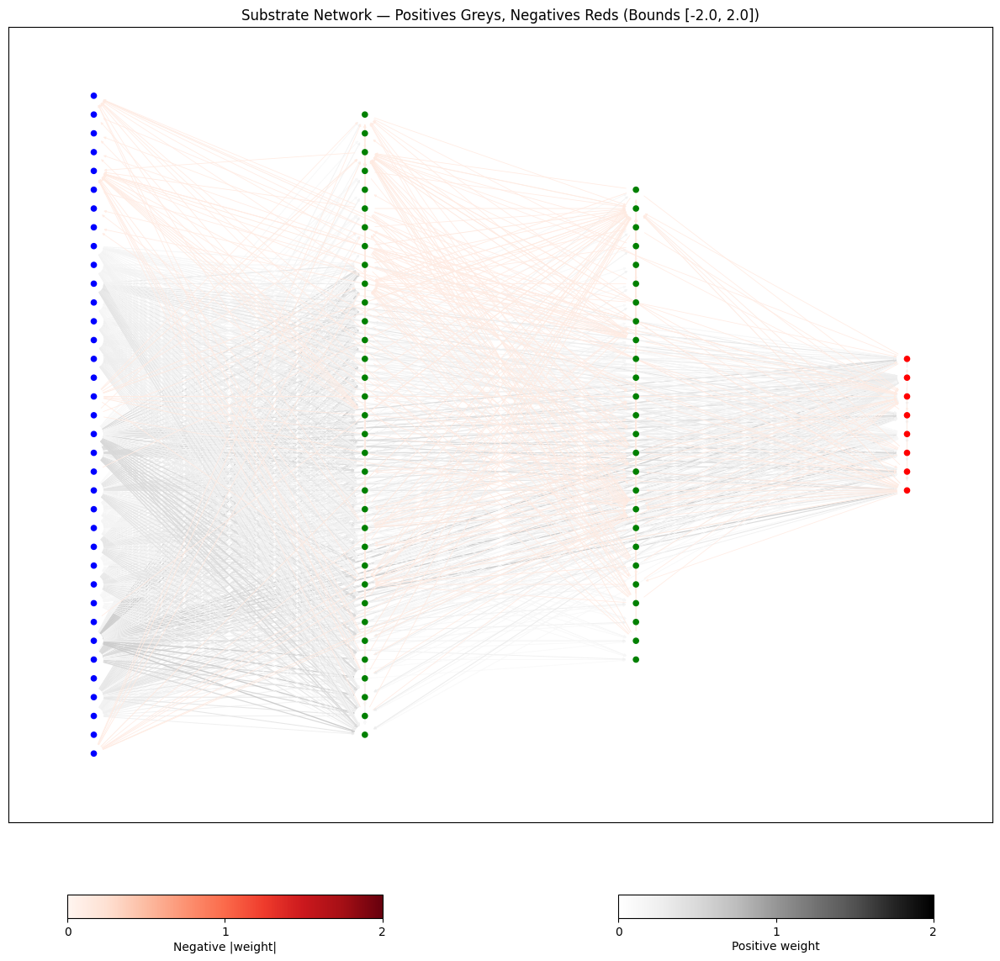

Visualization saved to: output/ant/topology/nn_random_pca65.svg


initializing
initializing finished
start compile


2025-09-09 04:42:50.668078: W external/xla/xla/hlo/transforms/simplifiers/hlo_rematerialization.cc:3023] Can't reduce memory use below 10.99GiB (11797747132 bytes) by rematerialization; only reduced to 12.17GiB (13067284088 bytes), down from 12.61GiB (13539143312 bytes) originally


compile finished, cost time: 30.274348s
Generation: 1, Cost time: 6894.73ms
 	fitness: valid cnt: 600, max: 23.9574, min: -137.5352, mean: -79.8295, std: 32.2703

	node counts: max: 19, min: 17, mean: 18.08
 	conn counts: max: 47, min: 29, mean: 43.03
 	species: 15, [258, 21, 70, 10, 37, 27, 15, 2, 18, 5, 17, 34, 28, 10, 48]

Generation: 2, Cost time: 6878.83ms
 	fitness: valid cnt: 600, max: 52.4420, min: -143.4126, mean: -70.0581, std: 38.9501

	node counts: max: 20, min: 16, mean: 18.10
 	conn counts: max: 48, min: 14, mean: 41.10
 	species: 15, [21, 23, 44, 10, 49, 36, 14, 154, 45, 40, 2, 34, 31, 4, 93]

Generation: 3, Cost time: 6909.54ms
 	fitness: valid cnt: 600, max: 68.6576, min: -139.4293, mean: -49.4483, std: 43.9994

	node counts: max: 21, min: 16, mean: 18.20
 	conn counts: max: 49, min: 2, mean: 39.03
 	species: 15, [45, 49, 136, 4, 37, 40, 36, 23, 38, 26, 35, 3, 12, 36, 80]

Generation: 4, Cost time: 6944.97ms
 	fitness: valid cnt: 600, max: 87.6749, min: -138.0804, mean

fitness_max,▁▂▂▂▃▃▄▄▄▆▇▇██▇▇▇▇█▇██▇▇██▇█▇█▇█▇███▇██▇
fitness_mean,▁▁▁▁▂▂▃▃▄▄▄▄▆▆▇▇▇▆▇▆▇▇█▇█▇▇▇▇▇██▇▇█▇▇▇▇▆
fitness_min,▆▅▇▇▅▆▆▅▅▅▄▇▆▁▆▂▄▇▇▅▅▇▄▅▆▅▅██▅▅▇▄▇█▅▄▄▆▄
fitness_std,▁▁▁▂▂▂▂▃▃▃▄▅▆▆▆▇▇▇▇▇▇█▇████▇▇▇███▇▇▇▇▇█▇
generation,▁▁▁▂▂▂▂▂▂▂▃▃▃▃▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▆▆▆▆▆▆▇▇▇█
fitness_max,462.34625
fitness_mean,97.11942
fitness_min,-126.89205
fitness_std,140.33366
generation,400


Total reward:  481.34543


/home/andi/anaconda3/envs/jax/lib/python3.10/subprocess.py:1796: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = _posixsubprocess.fork_exec(


mp4 saved to:  output/ant/video/agent_random_pca99.mp4
Visualizing CPPN. Saving to output/ant/topology/cppn_random_pca99.svg.
Manually reconstructing the phenotype. A visual layout will be generated.
Substrate has 7072 potential connections.
Visualizing 2570 connections. Excluded loops. Weight threshold: 0.1


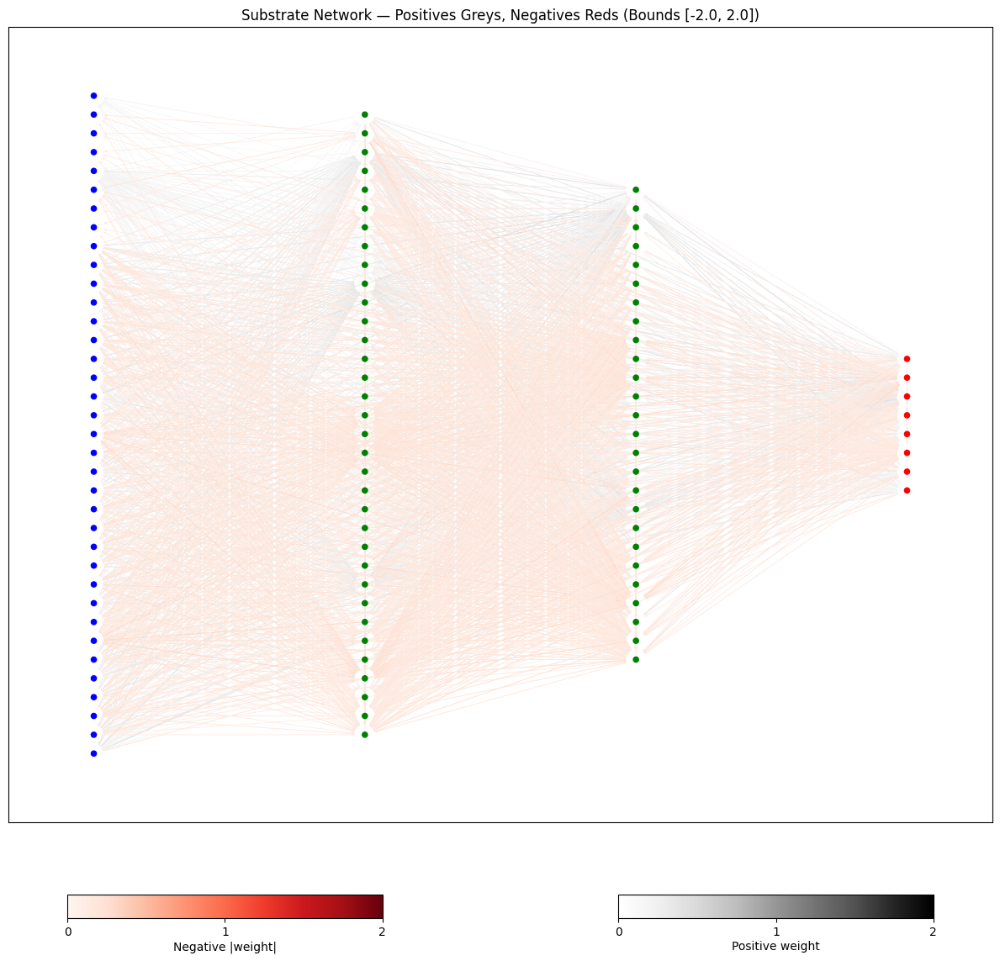

Visualization saved to: output/ant/topology/nn_random_pca99.svg


initializing
initializing finished
start compile


2025-09-09 05:33:06.019219: W external/xla/xla/hlo/transforms/simplifiers/hlo_rematerialization.cc:3023] Can't reduce memory use below 10.99GiB (11797747132 bytes) by rematerialization; only reduced to 12.17GiB (13067284088 bytes), down from 12.61GiB (13539143312 bytes) originally


compile finished, cost time: 32.503779s
Generation: 1, Cost time: 7055.22ms
 	fitness: valid cnt: 600, max: 28.1255, min: -141.8701, mean: -80.9574, std: 32.4556

	node counts: max: 19, min: 17, mean: 18.08
 	conn counts: max: 47, min: 29, mean: 43.03
 	species: 15, [255, 12, 70, 10, 6, 36, 51, 19, 25, 31, 3, 12, 12, 44, 14]

Generation: 2, Cost time: 7226.51ms
 	fitness: valid cnt: 600, max: 42.6998, min: -141.4219, mean: -73.6078, std: 36.4818

	node counts: max: 20, min: 16, mean: 18.07
 	conn counts: max: 48, min: 14, mean: 40.75
 	species: 15, [46, 32, 64, 45, 43, 37, 15, 119, 21, 56, 54, 29, 9, 5, 25]

Generation: 3, Cost time: 7285.94ms
 	fitness: valid cnt: 600, max: 50.8676, min: -132.8180, mean: -55.3393, std: 42.8900

	node counts: max: 20, min: 15, mean: 18.09
 	conn counts: max: 48, min: 0, mean: 37.78
 	species: 15, [69, 65, 67, 39, 27, 23, 15, 47, 59, 29, 49, 6, 11, 15, 79]

Generation: 4, Cost time: 7120.76ms
 	fitness: valid cnt: 600, max: 52.9534, min: -130.7966, mean

fitness_max,▁▂▂▃▃▄▄▃▄▃▄▄▄▄▅▄▄▅▅▅▅▄▅▅▅▆▆▆▆▆▇▇▇▇▆█▇▆▆▇
fitness_mean,▁▁▂▂▃▄▄▄▄▆▆▆▅▆▆▇▆▇▆▇▆▅▆▅▆▆▇▅▇▆▆▆▆████▇▆▆
fitness_min,▆▆▆▅▅▅▆▆▆▅▆▄▆▆▇█▇▆▆▇▆▆▇▃▆▆▅▆▅▆▇▆▁▆▇██▆██
fitness_std,▁▂▂▃▃▄▄▄▄▄▅▅▅▅▅▅▅▅▆▅▅▅▆▅▅▆▆▆▇█▇▇█▆▇▆▆▆▅▇
generation,▁▁▁▁▁▂▂▃▃▃▃▃▃▃▄▄▄▄▅▅▅▅▅▅▅▅▆▆▆▆▆▆▆▇▇▇▇▇██
fitness_max,456.14633
fitness_mean,47.19016
fitness_min,-126.04436
fitness_std,98.46449
generation,400


Total reward:  516.56445


/home/andi/anaconda3/envs/jax/lib/python3.10/subprocess.py:1796: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = _posixsubprocess.fork_exec(


mp4 saved to:  output/ant/video/agent_random_inv_pca_.mp4
Visualizing CPPN. Saving to output/ant/topology/cppn_random_inv_pca_.svg.
Manually reconstructing the phenotype. A visual layout will be generated.
Substrate has 7072 potential connections.
Visualizing 1171 connections. Excluded loops. Weight threshold: 0.1


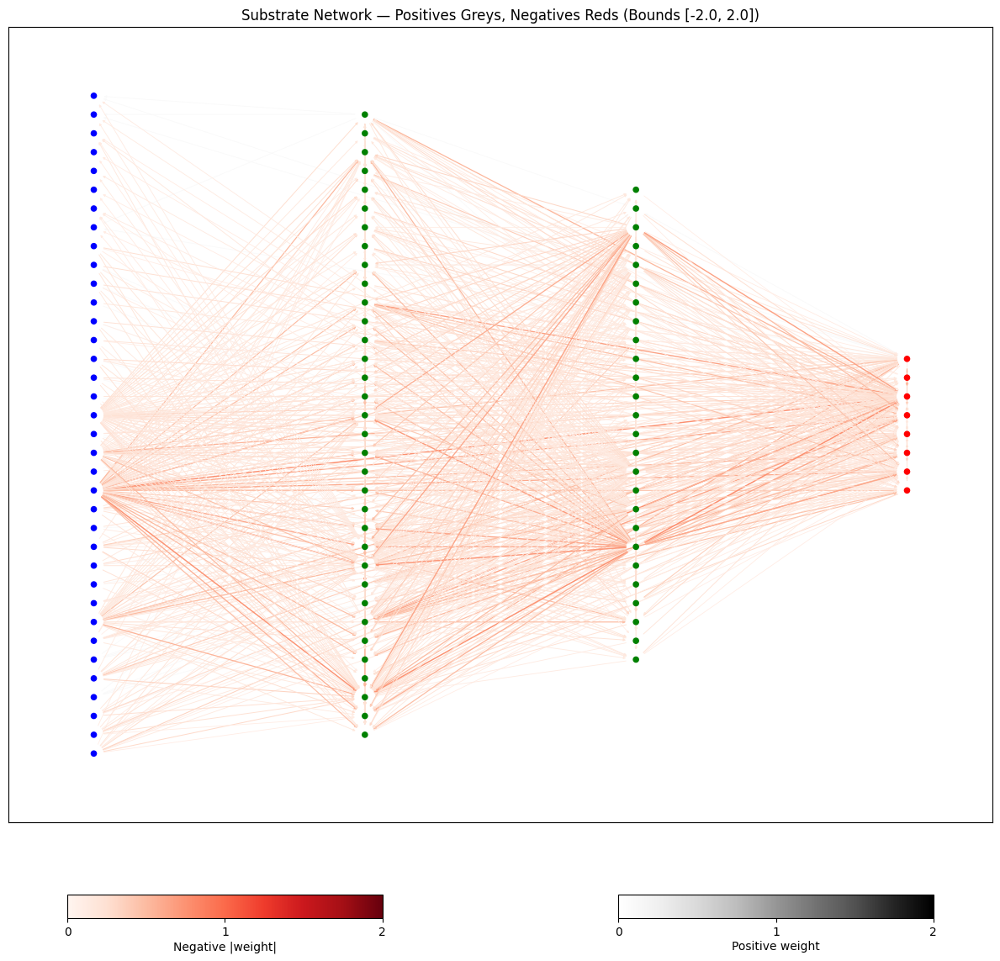

Visualization saved to: output/ant/topology/nn_random_inv_pca_.svg


initializing
initializing finished
start compile


2025-09-09 06:23:52.510616: W external/xla/xla/hlo/transforms/simplifiers/hlo_rematerialization.cc:3023] Can't reduce memory use below 10.99GiB (11797747132 bytes) by rematerialization; only reduced to 12.17GiB (13067284088 bytes), down from 12.61GiB (13539143312 bytes) originally


compile finished, cost time: 34.971626s
Generation: 1, Cost time: 7046.06ms
 	fitness: valid cnt: 600, max: 40.4901, min: -136.9982, mean: -80.5537, std: 31.3281

	node counts: max: 19, min: 17, mean: 18.08
 	conn counts: max: 47, min: 29, mean: 43.03
 	species: 14, [417, 12, 19, 9, 4, 11, 11, 20, 11, 14, 34, 7, 18, 13]

Generation: 2, Cost time: 7047.39ms
 	fitness: valid cnt: 600, max: 56.1250, min: -147.8749, mean: -71.0451, std: 38.7428

	node counts: max: 20, min: 16, mean: 18.03
 	conn counts: max: 48, min: 14, mean: 39.69
 	species: 15, [67, 59, 41, 158, 39, 26, 28, 27, 6, 16, 23, 13, 18, 3, 76]

Generation: 3, Cost time: 7074.73ms
 	fitness: valid cnt: 600, max: 67.8182, min: -144.3096, mean: -50.2487, std: 43.7820

	node counts: max: 20, min: 15, mean: 17.87
 	conn counts: max: 48, min: 0, mean: 36.33
 	species: 15, [83, 78, 18, 50, 32, 38, 46, 37, 8, 40, 22, 35, 34, 44, 35]

Generation: 4, Cost time: 7105.12ms
 	fitness: valid cnt: 600, max: 74.6136, min: -137.5084, mean: -39

fitness_max,▂▁▂▁▄▂▄▄▄▅▅▄▅▅▆▅▅▆▆▆▆▅▅▇▇▆▅▇▆▇▇▆▆▆▇▆█▆▇█
fitness_mean,▁▅▅▅▆▆▆▆▆▆▆▆▆▇▇▆▇▇▇▇▇▇▇▇▇▇▆▇████▇▇▇▆▇▇▇█
fitness_min,▅▃▅███▇▄▂▆██▇▆█▃▇▆▆▆▄▅▁▆▆▇▄▃▄▂▆▄▇█▆▆▆▅▂▅
fitness_std,▁▂▂▃▃▄▅▄▄▅▄▄▅▅▅▅▅▅▆▆▅▅▆▅▇████▇▅▆▇█▇▆▆▆▇█
generation,▁▁▂▂▂▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇█████
fitness_max,394.43442
fitness_mean,60.71337
fitness_min,-121.55564
fitness_std,109.43081
generation,400


Total reward:  369.95782


/home/andi/anaconda3/envs/jax/lib/python3.10/subprocess.py:1796: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = _posixsubprocess.fork_exec(


mp4 saved to:  output/ant/video/agent_random_fa.mp4
Visualizing CPPN. Saving to output/ant/topology/cppn_random_fa.svg.
Manually reconstructing the phenotype. A visual layout will be generated.
Substrate has 7072 potential connections.
Visualizing 1936 connections. Excluded loops. Weight threshold: 0.1


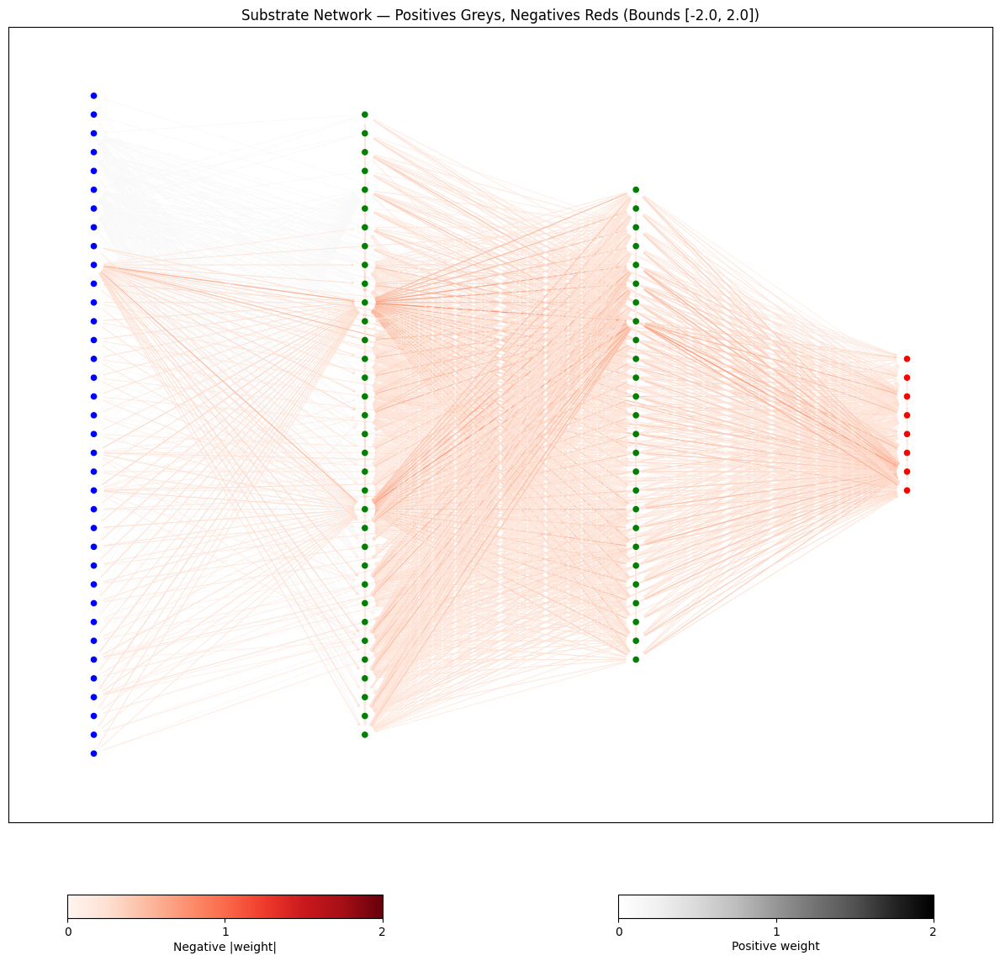

Visualization saved to: output/ant/topology/nn_random_fa.svg


initializing
initializing finished
start compile


2025-09-09 07:13:14.522207: W external/xla/xla/hlo/transforms/simplifiers/hlo_rematerialization.cc:3023] Can't reduce memory use below 10.99GiB (11797747132 bytes) by rematerialization; only reduced to 12.17GiB (13067284088 bytes), down from 12.61GiB (13539143312 bytes) originally


compile finished, cost time: 35.266649s
Generation: 1, Cost time: 7086.68ms
 	fitness: valid cnt: 600, max: 48.5381, min: -141.4137, mean: -81.2705, std: 30.9416

	node counts: max: 19, min: 17, mean: 18.08
 	conn counts: max: 47, min: 29, mean: 43.03
 	species: 15, [298, 17, 98, 18, 9, 27, 30, 11, 22, 7, 45, 2, 3, 4, 9]

Generation: 2, Cost time: 7075.66ms
 	fitness: valid cnt: 600, max: 50.2392, min: -153.0675, mean: -70.4414, std: 39.2066

	node counts: max: 20, min: 16, mean: 18.03
 	conn counts: max: 48, min: 14, mean: 40.40
 	species: 15, [202, 39, 9, 38, 52, 32, 56, 39, 21, 26, 40, 3, 11, 7, 25]

Generation: 3, Cost time: 7107.25ms
 	fitness: valid cnt: 600, max: 64.9383, min: -151.9347, mean: -48.9703, std: 47.9032

	node counts: max: 21, min: 16, mean: 18.01
 	conn counts: max: 49, min: 14, mean: 37.83
 	species: 15, [17, 38, 45, 70, 68, 40, 13, 24, 39, 23, 44, 38, 27, 2, 112]

Generation: 4, Cost time: 7143.77ms
 	fitness: valid cnt: 600, max: 145.9967, min: -151.7076, mean: 

fitness_max,▁▁▂▃▃▆▆▆▆▇▇█▇▇▇█▇▇▇█████▇█▇█████▇▇▇█▇█▇▇
fitness_mean,▁▁▁▂▂▂▂▂▅▄▅▆▆▇▆▆▇▇▇▆▇██▇██▇█▇▇▇███▇▇▇▇▇▇
fitness_min,▄▃▂▅▂▅▅▅▆▁▁▆▆▇▅▃▅▆▅▇▄█▆▆▅▇▅▆▄▄▅▇▄▆▆▄▄▃▂▅
fitness_std,▂▁▁▁▁▂▂▁▃▄▄▆▅▆▆▇▇▇▇▆▇▇▇▇█▇▇▆▆▆▆▆▆▆▇▇▇▇█▇
generation,▁▁▂▂▂▂▂▃▃▃▃▃▃▃▃▄▄▄▄▄▄▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇████
fitness_max,409.70923
fitness_mean,91.7816
fitness_min,-135.64218
fitness_std,122.34544
generation,400


Total reward:  351.72162


/home/andi/anaconda3/envs/jax/lib/python3.10/subprocess.py:1796: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = _posixsubprocess.fork_exec(


mp4 saved to:  output/ant/video/agent_random_sdl.mp4
Visualizing CPPN. Saving to output/ant/topology/cppn_random_sdl.svg.
Manually reconstructing the phenotype. A visual layout will be generated.
Substrate has 7072 potential connections.
Visualizing 4563 connections. Excluded loops. Weight threshold: 0.1


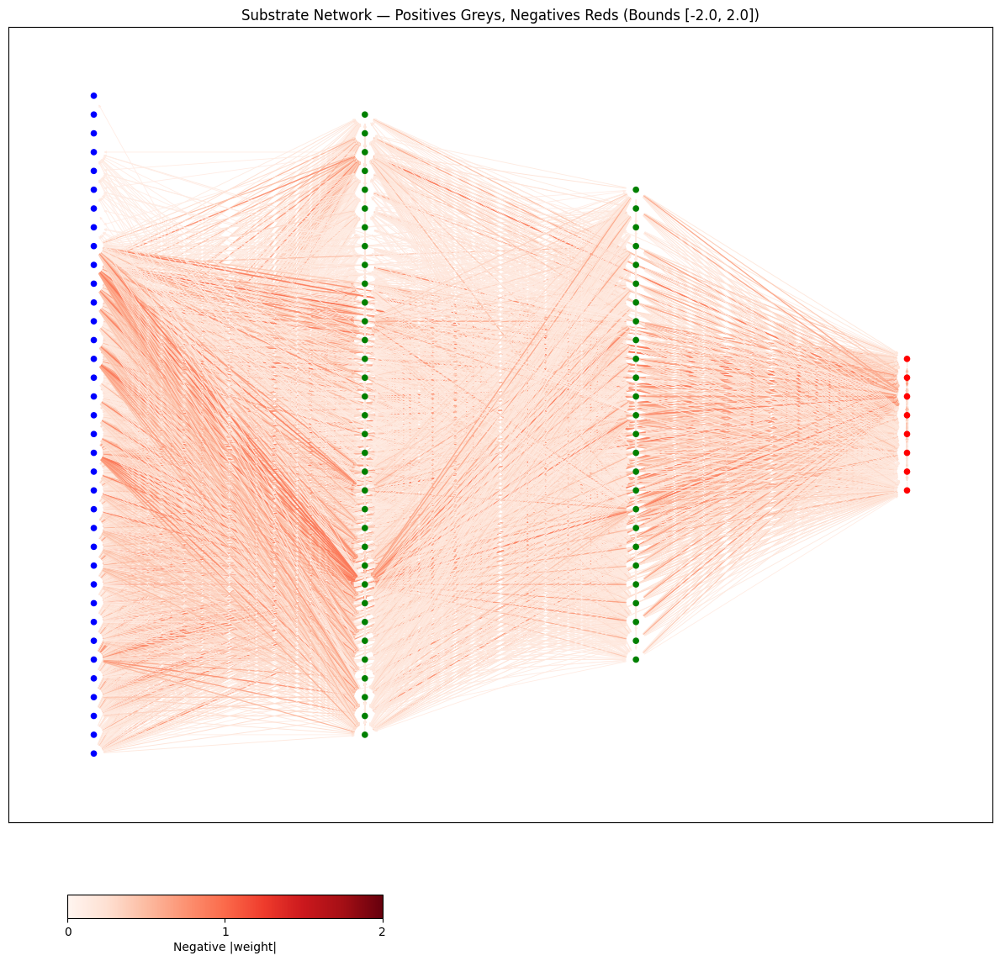

Visualization saved to: output/ant/topology/nn_random_sdl.svg


In [15]:
for data_label, data_dict in substrates.items():
    for method_label, method_dict in data_dict.items():

        active_substrate = substrates[data_label][method_label]["substrate"]
        evol_algorithm = create_evol_algorithm(substrate=active_substrate)

        wanbd_name = f"{env_name}_{data_label}_{method_label}"
        wandb_tags = [config["substrate"]["hidden_layer_type"], env_name, data_label, method_label]

        wandb.init(
            name=wanbd_name,
            project="substrate_dims",
            tags=wandb_tags,
            config=config  
        )

        wandb.config.update({
            "substrate": {
                "obs_size": obs_size,
                "act_size": act_size,
                "substrate.query_coors.shape": active_substrate.query_coors.shape, # (num_queries, query_dim)
                "algorithm.num_inputs": evol_algorithm.num_inputs,
                }
            }
        )

        pipeline = CustomPipeline(
            algorithm=evol_algorithm,
            problem=env_problem,
            seed=config["experiment"]["seed"],
            generation_limit=config["evolution"]["generation_limit"],
            fitness_target=config["evolution"]["fitness_target"],
            is_save=False,
            save_dir=config["experiment"]["output_dir"],
        )

        init_state = pipeline.setup()
        state = pipeline.auto_run(state=init_state)

        print(f"\nTraining finished. Best fitness achieved: {pipeline.best_fitness}")

        wandb.finish()

        state_for_show = state[0] if isinstance(state, tuple) else state

        # Transform the best genome into network parameters
        best_genome = pipeline.best_genome

        # Built-in show method to produce and save a video of the agent
        pipeline.show(
            state=state_for_show,
            best=best_genome,
            output_type="mp4",
            save_path=f"{OUTPUT_DIR}/video/agent_{data_label}_{method_label}.mp4",
        )

        # All coordinates are needed for visualization
        input_coors = substrates[data_label][method_label]["input_coors"]
        hidden_coors = substrates[data_label][method_label]["hidden_coors"]
        output_coors = substrates[data_label][method_label]["output_coors"]

        # Visualizes the CPPN
        visualize_cppn(
            pipeline=pipeline, 
            state=state, 
            save_path=f"{OUTPUT_DIR}/topology/cppn_{data_label}_{method_label}.svg"
            )
        # Visualizes a representation of the neural network in 2D space
        visualize_nn(
            pipeline=pipeline, 
            state=state, 
            save_path=f"{OUTPUT_DIR}/topology/nn_{data_label}_{method_label}.svg", 
            substrate=active_substrate, 
            input_coors=input_coors, 
            hidden_coors=hidden_coors, 
            output_coors=output_coors, 
            hidden_depth=config["substrate"]["hidden_depth"], 
            weight_lower_limit=config["algorithm"]["conn_weight_lower_bound"], 
            weight_upper_limit=config["algorithm"]["conn_weight_upper_bound"]
            )
